<a href="https://colab.research.google.com/github/ctrivino1/Predicting-House-Prices-Machine-Learning-Algorithms-/blob/main/Final_Housing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import altair as alt
from statistics import median
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import roc_auc_score





housing = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/housing.csv')

housing2 = housing

In [2]:
housing.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


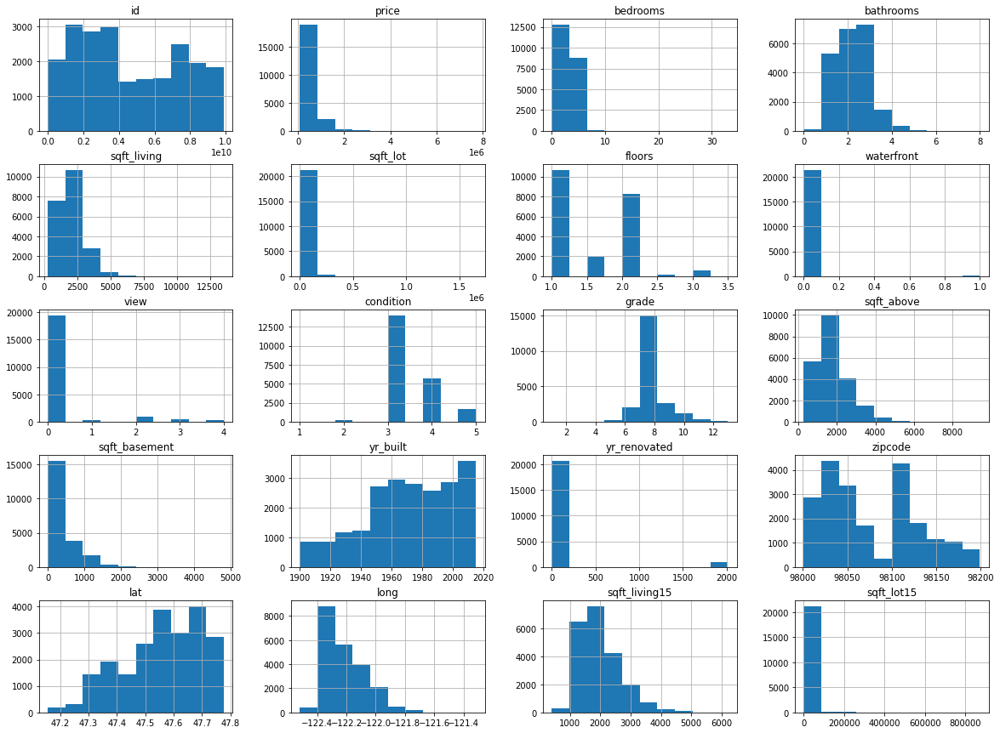

In [3]:
% matplotlib inline
import matplotlib.pyplot as plt
housing.hist(bins=10, figsize=(20,15))
plt.show()

In [4]:
housing.isnull().sum(axis=0)
## no missing values

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [5]:
housing.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [6]:
## possible correlations
corY = pd.DataFrame(housing.corr().price).reset_index()

corY.head()

,index,price
0,id,-0.016762
1,price,1.000000
2,bedrooms,0.308350
3,bathrooms,0.525138
4,sqft_living,0.702035


In [7]:
alt.Chart(corY).mark_bar().encode(
    alt.X("index"),
    alt.Y("price")
).properties(width=500) 

## this shows the id, and zipcode may have a negative correlation. But this is just theory, not proof

alt.Chart(...)

In [8]:
## sqfit_living with price

alt.data_transformers.disable_max_rows()

alt.Chart(housing).mark_circle().encode(
    alt.X("sqft_living"),
    alt.Y("price")
).properties(width=500) 


alt.Chart(...)

In [9]:
## data wrangling #

## data wranglign for dat ##

y = housing["price"]
 



from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

# One hot encoding 
housing.zipcode = housing.zipcode.astype("str") # making zipcode a string so I can onehotencode it
housing = pd.get_dummies(housing.drop(["date", "price", "id"], axis=1)) # get dummies doesn't affect numeric, it does one hot encoding on strings

## min max scaling
scaler = MinMaxScaler()

scaler.fit(housing)

X = pd.DataFrame(scaler.transform(housing))










# **Random Forest Regressor**

Splitting and training the data


In [10]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)


reg1 = RandomForestRegressor(n_estimators = 10, random_state = 0)
reg1.fit(X_train, y_train)



RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=10, n_jobs=None, oob_score=False,
                      random_state=0, verbose=0, warm_start=False)

Predicting the data

In [11]:
## get help ## 


y_pred = reg1.predict(X_test)


R^2

In [12]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.8791582138494207

Cross Validation

In [13]:
from sklearn.model_selection import cross_val_score

# is supposed to be used on the training set
accuracies = cross_val_score(estimator = reg1, X = X_train, y = y_train, cv = 10) # 4 essitional paramters
#1. estimator(which is my classifier)
#2. input features of the training set X_train
#3.input the dependent variable of the trianing set y_train
#4. number of folds I want to have
# classifier comes from the model class I choose

print("Accuracy: {:.2f} %".format(accuracies.mean()*100)) # a float with two decimals after the comma, * 100 makes it a percentage
# accuracies.mean() gives me the average accuracies for the 10 tests
print("Standard Deviation: {:.2f} %".format(accuracies.std()*100)) # shows standard deviation

Accuracy: 85.10 %
Standard Deviation: 1.27 %


RMSE

In [14]:


from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor

reg1.fit(X_train, y_train)

mse = mean_squared_error(y_test, reg1.predict(X_test), squared=False) # squared gives me rmse and without it, just mse
print("The root mean squared error (MSE) on test set: {:.4f}".format(mse))



The root mean squared error (MSE) on test set: 119879.1939


## **Gradient boosting model** 

In [15]:


from sklearn.ensemble import GradientBoostingRegressor


X2 = X

y2 = y

reg2 = GradientBoostingRegressor(n_estimators= 10, random_state=0)

X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size = 0.2, random_state = 0)
reg2 = GradientBoostingRegressor(n_estimators= 10, random_state=0, max_depth=6)

reg2.fit(X_train2, y_train2)



GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=6,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=10,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=0, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

R^2

In [16]:
from sklearn.metrics import r2_score

y_pred2 = reg2.predict(X_test2)

r2_score(y_test2, y_pred2)

0.720310212297971

RMSE

In [17]:
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor

reg2.fit(X_train2, y_train2)

mse = mean_squared_error(y_test2, reg2.predict(X_test2), squared=False) # squared gives me rmse and without it, just mse
print("The root mean squared error (MSE) on test set: {:.4f}".format(mse))

The root mean squared error (MSE) on test set: 182378.4626


K fold cross validation

In [18]:


from sklearn.model_selection import cross_val_score

# is supposed to be used on the training set
accuracies = cross_val_score(estimator = reg2, X = X_train2, y = y_train2, cv = 10) # 4 essitional paramters
#1. estimator(which is my classifier)
#2. input features of the training set X_train
#3.input the dependent variable of the trianing set y_train
#4. number of folds I want to have
# classifier comes from the model class I choose

print("Accuracy: {:.2f} %".format(accuracies.mean()*100)) # a float with two decimals after the comma, * 100 makes it a percentage
# accuracies.mean() gives me the average accuracies for the 10 tests
print("Standard Deviation: {:.2f} %".format(accuracies.std()*100)) # shows standard deviation



Accuracy: 70.76 %
Standard Deviation: 2.18 %


# XGBoost #

In [19]:
from xgboost import XGBRegressor

reg3 = XGBRegressor(objective="reg:squarederror", colsample_bytree= 0.7, learning_rate= 0.095, max_depth= 5, min_child_weight= 3, n_estimators= 500, nthread= 4, silent= 1, subsample= 0.8)
#.8
X3 = X
y3 = y

X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, y3, test_size = 0.2, random_state = 0)


reg3.fit(X_train3, y_train3)
## accuracy scores is not a good measuring metric because If I'm off .1 it will say i"m wrong. It works great on classification problems.

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0,
             importance_type='gain', learning_rate=0.095, max_delta_step=0,
             max_depth=5, min_child_weight=3, missing=None, n_estimators=500,
             n_jobs=1, nthread=4, objective='reg:squarederror', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None, silent=1,
             subsample=0.8, verbosity=1)

R^2

In [20]:
y_pred3 = reg3.predict(X_test3)


from sklearn.metrics import r2_score
r2_score(y_test3, y_pred3)



0.9159969363905339

RMSE

In [21]:
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor

reg3.fit(X_train3, y_train3)

mse = mean_squared_error(y_test3, reg3.predict(X_test3), squared=False) # squared gives me rmse and without it, just mse
print("The root mean squared error (MSE) on test set: {:.2f}".format(mse))

The root mean squared error (MSE) on test set: 99950.00


K Fold Validation

In [22]:
from sklearn.model_selection import cross_val_score

# is supposed to be used on the training set
accuracies = cross_val_score(estimator = reg3, X = X_train3, y = y_train3, cv = 10) # 4 essitional paramters
#1. estimator(which is my classifier)
#2. input features of the training set X_train
#3.input the dependent variable of the trianing set y_train
#4. number of folds I want to have
# classifier comes from the model class I choose

print("Accuracy: {:.2f} %".format(accuracies.mean()*100)) # a float with two decimals after the comma, * 100 makes it a percentage
# accuracies.mean() gives me the average accuracies for the 10 tests
print("Standard Deviation: {:.2f} %".format(accuracies.std()*100)) # shows standard deviation

Accuracy: 89.58 %
Standard Deviation: 1.52 %


# Random Grid search experimientation 

In [23]:
#reg3 = XGBRegressor(objective="reg:squarederror", colsample_bytree= 0.7, learning_rate= 0.095, max_depth= 5, min_child_weight= 3, n_estimators= 500, nthread= 4, silent= 1, subsample= 0.8)



xgb1 = XGBRegressor()
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:squarederror'],
              'learning_rate': [.095], #so called `eta` value 
              'max_depth': [5],
              'min_child_weight': [3],
              'silent': [1],
              'subsample': [0.8,.9],
              'colsample_bytree': [.8,],
              'n_estimators': [500]}
# finding minchild_rate : , silent: 
# learning rate = .095
# max_depth = 5
# subsample = .8 
xgb_grid = GridSearchCV(xgb1,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True,)
xgb_grid.fit(X3, y3)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)



Fitting 2 folds for each of 2 candidates, totalling 4 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done   4 out of   4 | elapsed:   47.8s finished


0.8777870072149135
{'colsample_bytree': 0.8, 'learning_rate': 0.095, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:squarederror', 'silent': 1, 'subsample': 0.8}


# 2nd Model with prices only in interquartile range

In [24]:
housing2.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [25]:
alt.Chart(housing2).mark_circle().encode(
    alt.X("price"),
    alt.Y("count()")
)

alt.Chart(...)

In [26]:
from scipy.stats import iqr
from numpy import percentile
from numpy import quantile


Q1 = housing2.price.quantile(0.25)
Q3 = housing2.price.quantile(0.75)
IQR = Q3 - Q1

# Filtering Values between Q1-1.5IQR and Q3+1.5IQR
housing2.query(" price >= (@Q1 - 1.5 * @IQR) and price <= (@Q3 + 1.5 * @IQR)", inplace = True )



In [27]:
y_h2 = housing2["price"]
housing2.drop(["date", "price", "id"], axis=1, inplace= True) 



from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler

# One hot encoding 
housing2.zipcode = housing2.zipcode.astype("str") # making zipcode a string so I can onehotencode it
housing2 = pd.get_dummies(housing2) # get dummies doesn't affect numeric, it does one hot encoding on strings

## min max scaling
scaler = MinMaxScaler()

scaler.fit(housing2)

X_h2 = pd.DataFrame(scaler.transform(housing2))

In [28]:
from xgboost import XGBRegressor


Xh2_temp, Xh2_val, yh2_temp, yh2_val = train_test_split(X_h2, y_h2, test_size = 0.10)
Xh2_train, Xh2_test, yh2_train, yh2_test = train_test_split(Xh2_temp, yh2_temp, test_size = 0.20)


regh2 =  XGBRegressor(objective="reg:squarederror", colsample_bytree= 0.7, learning_rate= 0.05, max_depth= 7, min_child_weight= 4, n_estimators= 500, nthread= 4, silent= 1, subsample= 0.9)
regh2.fit(Xh2_temp, yh2_temp)


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.7, gamma=0,
             importance_type='gain', learning_rate=0.05, max_delta_step=0,
             max_depth=7, min_child_weight=4, missing=None, n_estimators=500,
             n_jobs=1, nthread=4, objective='reg:squarederror', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None, silent=1,
             subsample=0.9, verbosity=1)

 R^2

In [29]:
yh2_pred = regh2.predict(Xh2_val)


from sklearn.metrics import r2_score
r2_score(yh2_val, yh2_pred)

0.8882896238535248

RMSE

In [30]:
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor

regh2.fit(Xh2_temp, yh2_temp)

rmse = mean_squared_error(yh2_val, regh2.predict(Xh2_val), squared=False) # squared gives me rmse and without it, just mse
print("The root mean squared error (MSRE) on test set: {:.2f}".format(rmse))

The root mean squared error (MSRE) on test set: 69799.60


k-fold cross validation

In [31]:

# is supposed to be used on the training set
accuracies = cross_val_score(estimator = regh2, X = Xh2_temp, y = yh2_temp, cv = 10) # 4 essitional paramters
#1. estimator(which is my classifier)
#2. input features of the training set X_train
#3.input the dependent variable of the trianing set y_train
#4. number of folds I want to have
# classifier comes from the model class I choose

print("Accuracy: {:.2f} %".format(accuracies.mean()*100)) # a float with two decimals after the comma, * 100 makes it a percentage
# accuracies.mean() gives me the average accuracies for the 10 tests
print("Standard Deviation: {:.2f} %".format(accuracies.std()*100)) # shows standard deviation

Accuracy: 88.34 %
Standard Deviation: 0.64 %


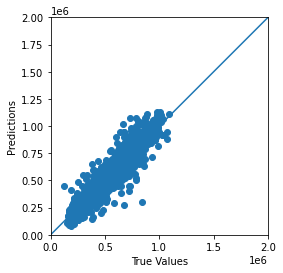

In [32]:
import matplotlib.pyplot as plt

## this shows my model that I made with my regression line. You can compare the Predicted Values to the true values and can see my predictions are pretty good. 
test_predictions = regh2.predict(Xh2_val).flatten()
a = plt.axes(aspect='equal')
plt.scatter(test_predictions, yh2_val)
plt.xlabel('True Values')
plt.ylabel('Predictions')
lims = [0, 2000000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)

Random grid search

In [33]:

xgb2 = XGBRegressor()
parameters = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['reg:squarederror'],
              'learning_rate': [.055,.05,.06], #so called `eta` value 
              'max_depth': [7],
              'min_child_weight': [4],
              'silent': [1],
              'subsample': [.9],
              'colsample_bytree': [.7],
              'n_estimators': [500]}

xgb_grid2 = GridSearchCV(xgb2,
                        parameters,
                        cv = 2,
                        n_jobs = 5,
                        verbose=True,)
xgb_grid2.fit(X_h2, y_h2)

print(xgb_grid2.best_score_)
print(xgb_grid2.best_params_)


Fitting 2 folds for each of 3 candidates, totalling 6 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done   4 out of   6 | elapsed:  1.1min remaining:   33.5s
[Parallel(n_jobs=5)]: Done   6 out of   6 | elapsed:  1.3min finished


0.87736935755653
{'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 7, 'min_child_weight': 4, 'n_estimators': 500, 'nthread': 4, 'objective': 'reg:squarederror', 'silent': 1, 'subsample': 0.9}


Validation test set

In [34]:
yh2_predict_val = regh2.predict(Xh2_val)


from sklearn.metrics import r2_score
r2_score(yh2_val, yh2_predict_val)

0.8882896238535248

RMSE

In [35]:
regh2.fit(Xh2_train, yh2_train)

rmse = mean_squared_error(yh2_test, regh2.predict(Xh2_test), squared=False) # squared gives me rmse and without it, just mse
print("The root mean squared error (MSE) on test set: {:.2f}".format(rmse))

The root mean squared error (MSE) on test set: 73959.31
